<!-- Notebook Header Start -->

<h1 align="center">Rat Trial DW333</h1>

<p align="center">
  <strong>Author:</strong> Karl Bates<br>
  <strong>Date:</strong> 2024-11-29<br>
  <strong>Affiliation:</strong> Carnegie Mellon University, Cohen-Karni Lab  || Neuromechatronics Lab
</p>

---


## 📊 Notebook Outline

* **Import Intan data in RHD format**
* **Package raw data into binary for Kilosort**
* **Run Kilosort to extract spike activity**
* **Calculate average firing rate of each cluster during a window of time.**

## 📚 References & Additional Resources

- [Kilosort4 docs](https://github.com/MouseLand/Kilosort/tree/main)
- [SpikeInterface docs](https://github.com/SpikeInterface)

---

<!-- Notebook Header End -->


# 📈 Importing Libraries & Data
---

### imports

In [1]:
# standard imports
from pathlib import Path
import os
import pandas as pd
import numpy as np
from kilosort import io
import matplotlib.pyplot as plt

# custom imports
from automations import RM1
from automations import SpikeInterface_wrapper
from automations import Kilosort_wrapper
from automations import plots

### probe definition

Using the spreadsheet, `Adapter_pinout.xlsx`, the contact ID's can be traced to the "device channel", and we can assign them on the probe. 

In this case, our channel indices correspond to the aux inputs to the intan headstage.

refer to the notebook, `RM1_pipeline.ipynb` within  the `dev_notebook` folder

In [ ]:
# Path definitions

# save data to the inbox; make sure that the folders: binary & figures exist
SAVE_DIRECTORY = Path(fr'D:\Data\CMU.80 Data\88 Analyzed Data\88.003 Initial Analysis, DW333')  # NOTE Specify the path where the data will be copied to, and where Kilosort4 results will be saved.

# in this case, the data is saved in a folder with multiple rats
DATA_DIRECTORY = Path(fr'D:\Data\CMU.80 Data\82 External Data\82.002 Sample Rat Data from RM1 Project')  # NOTE Specify the path where the data will be copied to, and where Kilosort4 results will be saved.
# Create path if it doesn't exis    t
DATA_DIRECTORY.mkdir(parents=True, exist_ok=True)
SAVE_DIRECTORY.mkdir(parents=True, exist_ok=True)
PROBE_DIRECTORY = Path(r'D:\Data\CMU.80 Data\88 Analyzed Data\88.008 SpikeNeuro-Linear-32\SpikeNeuro-Linear-32.prb')

# 🔁 Identifying an experiment for initial analysis

This is used to determine which trial is most likely to produce good units in a spike sorting analysis

---

### filepath definitions

In [3]:
channel_mapping = pd.read_excel(r"D:\Data\CMU.80 Data\88 Analyzed Data\88.008 SpikeNeuro-Linear-32\Adapter_pinout.xlsx",
                                sheet_name="summary",
                                header=2).iloc[:,[8,10,12,14]]
channel_mapping.head(5)

,Linear-32 Probe,A32->O32 Adapter,Intan Board,Intan Input.1
0,32,32,B2,7
1,31,31,T17,23
2,30,30,B3,6
3,29,29,T16,22
4,28,28,B4,5


### importing the rat

In [4]:
Rat = RM1.Rat(DATA_DIRECTORY, PROBE_DIRECTORY, "DW333")

Reading qsttest_1_241115_150618...
Error reading stream 2 for qsttest_1_241115_150618. continuing...
Reading qsttest_1_241115_151239...
Error reading stream 2 for qsttest_1_241115_151239. continuing...
Reading qsttest_1_241115_151523...
Error reading stream 2 for qsttest_1_241115_151523. continuing...
Reading qst_1_241115_152031...
Error reading stream 2 for qst_1_241115_152031. continuing...
Reading qst_1_241115_152346...
Error reading stream 2 for qst_1_241115_152346. continuing...
Reading qst_1_241115_152800...
Error reading stream 2 for qst_1_241115_152800. continuing...
Reading VF_DRG_1_241115_145120...
Error reading stream 2 for VF_DRG_1_241115_145120. continuing...
Reading VF_DRG_1_241115_145435...
Error reading stream 2 for VF_DRG_1_241115_145435. continuing...
Reading VF_DRG_1_241115_145739...
Error reading stream 2 for VF_DRG_1_241115_145739. continuing...
Reading VF_DRG_4_241115_153512...
Error reading stream 2 for VF_DRG_4_241115_153512. continuing...
Reading VF_DRG_4_24111

In [5]:
# for example, pulling the amp data from the 7th DRGS trial (only works for DW333)
# DW322.mat_files_dict["VF_DRG__145435"]["AM"]["amp"][0, 0][0, 0]

In [6]:
Rat.qst_experiment_notes

'd1 is ttl, d2 am sync, a1 am monitor, a2 e von frey'

In [7]:
Rat.qst_trial_notes
# Rat.qst_trial_notes.columns

5,Trial Number,Condition,amp,PW (us),Freq. (Hz),drgDur. (s),Stimuli,temp,Stimuli Dur.,NaN
Trial Number,,,,,,,,,,
1,1,VF_DRG_,NaN,NaN,NaN,NaN,Von Frey,NaN,"1 s every 10 s,",NaN
2,2,VF_DRG_,NaN,NaN,NaN,NaN,Von Frey,NaN,"5 s every 10 s,",NaN
3,3,VF_DRG_,NaN,NaN,NaN,NaN,Von Frey,NaN,"5 s every 10 s,",NaN
4,4,VF_DRG_,NaN,NaN,NaN,NaN,Von Frey,NaN,"5 s every 10 s,",NaN
1,1,qst_,NaN,NaN,NaN,NaN,qst 52C,NaN,"5 s every 10 s,",hand held
2,2,qst_,NaN,NaN,NaN,NaN,qst 52C,NaN,"5 s every 10 s,",hand held
3,3,qst_,NaN,NaN,NaN,NaN,qst 52C,NaN,"5 s every 10 s,",hand held
1,1,VF_hooks_,NaN,NaN,NaN,NaN,Von Frey,NaN,"5 s every 10 s,",lots of noise on the start... b0 is first hook...
2,2,VF_hooks_,NaN,NaN,NaN,NaN,Von Frey,NaN,"5 s every 10 s,",b0 is first hook. b1 is second


In [ ]:
Rat.get_sc_data()
# removes the window of time where the DRG is stimulated; by default, it keeps the first & last 1,050,000 frames (35 seconds)
# Rat.remove_drg_stim_window()

### process data for import into Kilosort

I will use a combination of `SpikeInterface` & `Kilosort.io.extractors` to get the data I need

In [9]:
signals = SpikeInterface_wrapper(Rat, SAVE_DIRECTORY)
signals.save_spinalcord_data_to_binary()

Preparing SpikeInterface wrapper for rat DW333
Data saved to D:\Data\CMU.80 Data\88 Analyzed Data\88.007 DRG Spikes during Von Frey\binary\qsttest_1_241115_150618\DW333_qsttest_1_241115_150618_data.bin
Data saved to D:\Data\CMU.80 Data\88 Analyzed Data\88.007 DRG Spikes during Von Frey\binary\qsttest_1_241115_151239\DW333_qsttest_1_241115_151239_data.bin
Data saved to D:\Data\CMU.80 Data\88 Analyzed Data\88.007 DRG Spikes during Von Frey\binary\qsttest_1_241115_151523\DW333_qsttest_1_241115_151523_data.bin
Data saved to D:\Data\CMU.80 Data\88 Analyzed Data\88.007 DRG Spikes during Von Frey\binary\qst_1_241115_152031\DW333_qst_1_241115_152031_data.bin
Data saved to D:\Data\CMU.80 Data\88 Analyzed Data\88.007 DRG Spikes during Von Frey\binary\qst_1_241115_152346\DW333_qst_1_241115_152346_data.bin
Data saved to D:\Data\CMU.80 Data\88 Analyzed Data\88.007 DRG Spikes during Von Frey\binary\qst_1_241115_152800\DW333_qst_1_241115_152800_data.bin
Data saved to D:\Data\CMU.80 Data\88 Analyzed D

In [10]:
# VF_DRG_pre = "VF_DRG_1_241115_145120"
# VF_DRG_pre = "VF_DRG_1_241115_145739"
VF_DRG_pre = "qst_1_241115_152031"
VF_DRG_post = "VF_DRG_1_241115_145739"

In [11]:
recording_pre = signals.data.intan_recordings_stream0[VF_DRG_pre]
digital_trace_pre = signals.data.intan_recordings_stream4[VF_DRG_pre].get_traces(channel_ids=['DIGITAL-IN-01'])
von_frey_pre = signals.data.intan_recordings_stream3[VF_DRG_pre]

In [12]:
recording_post = signals.data.intan_recordings_stream0[VF_DRG_post]
digital_trace_post = signals.data.intan_recordings_stream4[VF_DRG_post].get_traces(channel_ids=['DIGITAL-IN-01'])
von_frey_post = signals.data.intan_recordings_stream3[VF_DRG_post]

gain_to_uV: 312.5, offset_to_uV: -10240000.0


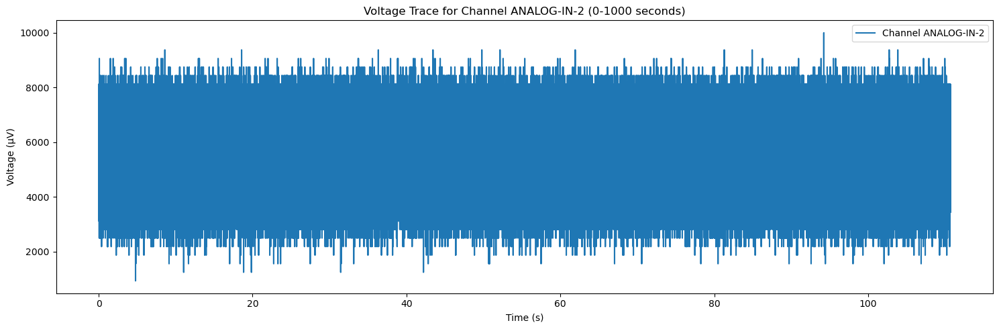

In [13]:
plots.static_trace(von_frey_pre,channel_id='ANALOG-IN-2',start_time=0, end_time=1000)

In [14]:
plots.interactive_trace(recording_post)

gain_to_uV: 0.195, offset_to_uV: -6389.76


gain_to_uV: 312.5, offset_to_uV: -10240000.0


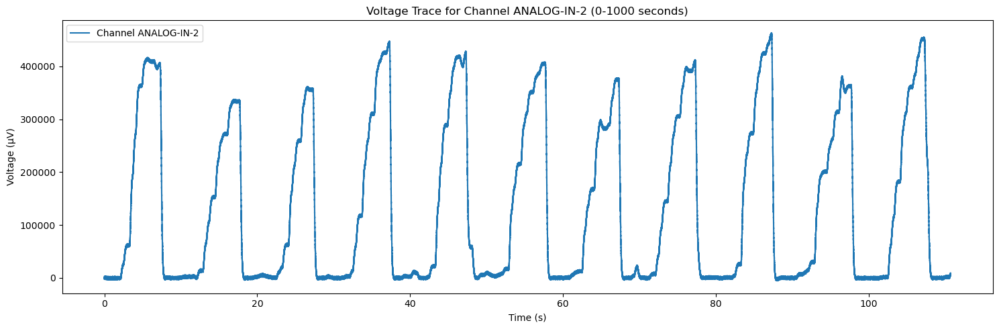

In [15]:
plots.static_trace(von_frey_post,channel_id='ANALOG-IN-2',start_time=0, end_time=1000)

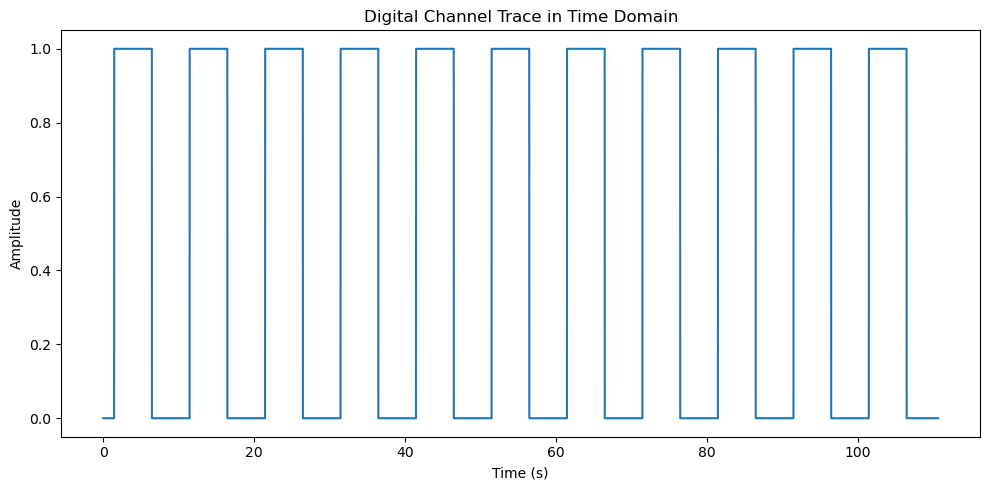

In [16]:
# Calculate the time vector
sampling_rate = 30000  # in Hz
num_samples = len(digital_trace_pre)
time_vector = np.arange(num_samples) / sampling_rate  # Time in seconds

# Plot the digital trace in the time domain
plt.figure(figsize=(10, 5))
plt.plot(time_vector, digital_trace_pre)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Digital Channel Trace in Time Domain')
plt.tight_layout()
plt.show()


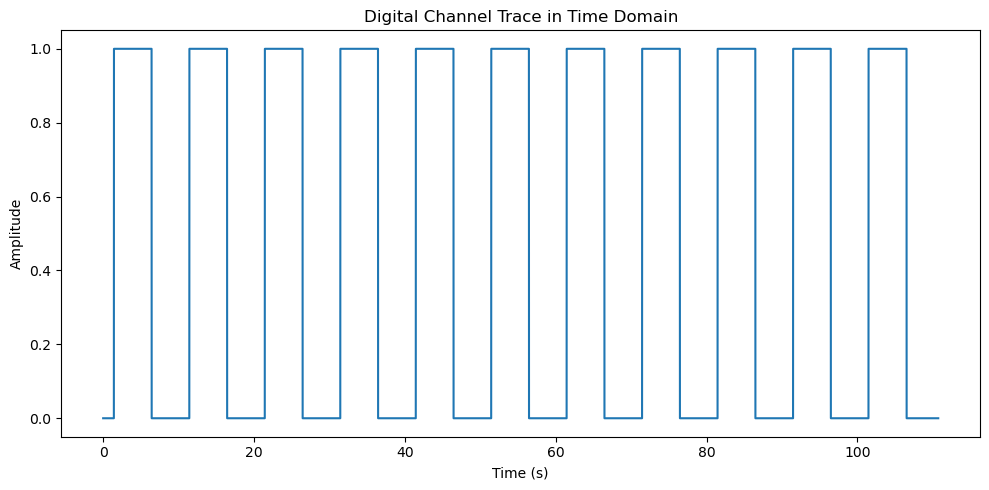

In [17]:
# Calculate the time vector
sampling_rate = 30000  # in Hz
num_samples = len(digital_trace_post)
time_vector = np.arange(num_samples) / sampling_rate  # Time in seconds

# Plot the digital trace in the time domain
plt.figure(figsize=(10, 5))
plt.plot(time_vector, digital_trace_post)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Digital Channel Trace in Time Domain')
plt.tight_layout()
plt.show()

# Extract windows of time where Von Frey stimulus is applied, calculate average stimulus and ECAP

In [18]:
# Assuming you have already imported the necessary libraries and loaded your data
# Replace 'digital_trace_pre', 'von_frey_pre', and 'recording_pre' with your actual variables

# Flatten the digital trace to a 1D array
digital_trace = digital_trace_pre.flatten()

# Threshold the digital trace to ensure it's binary (0 or 1)
threshold = 0.5  # Adjust based on your data
digital_trace_binary = (digital_trace > threshold).astype(int)

# Find indices where the digital trace goes from low to high (rising edge)
rising_edges = np.where((digital_trace_binary[:-1] == 0) & (digital_trace_binary[1:] == 1))[0] + 1  # +1 to correct index

# Find indices where the digital trace goes from high to low (falling edge)
falling_edges = np.where((digital_trace_binary[:-1] == 1) & (digital_trace_binary[1:] == 0))[0] + 1

# Handle cases where the trace starts high
if digital_trace_binary[0] == 1:
    rising_edges = np.insert(rising_edges, 0, 0)

# Handle cases where the trace ends high
if digital_trace_binary[-1] == 1:
    falling_edges = np.append(falling_edges, len(digital_trace_binary) - 1)

# Ensure that the number of rising and falling edges matches
if len(rising_edges) > len(falling_edges):
    rising_edges = rising_edges[:len(falling_edges)]
elif len(falling_edges) > len(rising_edges):
    falling_edges = falling_edges[:len(rising_edges)]

# Now, we can define the time windows
sampling_rate = recording_pre.get_sampling_frequency()
start_times = rising_edges / sampling_rate
end_times = falling_edges / sampling_rate

# Define buffers in seconds
# both of these are delayed by 2 milliseconds to account for the delay between the onset of stimulation and recording the response in the spinal cord
start_buffer = 0.002  # Time to add to the start of each interval
end_buffer = -0.002    # Time to subtract from the end of each interval

# Adjust the time windows
adjusted_start_times = start_times + start_buffer
adjusted_end_times = end_times - end_buffer

# Ensure that the adjusted times are within valid bounds
valid_indices = adjusted_start_times < adjusted_end_times

# Apply the valid indices to filter out any invalid intervals
adjusted_start_times = adjusted_start_times[valid_indices]
adjusted_end_times = adjusted_end_times[valid_indices]

# Convert adjusted times back to sample indices
adjusted_start_indices = (adjusted_start_times * sampling_rate).astype(int)
adjusted_end_indices = (adjusted_end_times * sampling_rate).astype(int)

# Ensure indices are within the valid range
num_samples = len(digital_trace_binary)
adjusted_start_indices = np.clip(adjusted_start_indices, 0, num_samples - 1)
adjusted_end_indices = np.clip(adjusted_end_indices, 0, num_samples - 1)

# Get Von Frey data (assuming 'ANALOG-IN-2' is the correct channel)
von_frey_data = von_frey_pre.get_traces(channel_ids=['ANALOG-IN-2'],return_scaled=True).flatten()

# Get recording data (all channels or specify channel_ids as needed)
recording_data = recording_pre.get_traces(return_scaled=True)

# Initialize lists to store averages
von_frey_averages = []
recording_averages = []

# Loop over each adjusted time window
for start_idx, end_idx in zip(adjusted_start_indices, adjusted_end_indices):
    # Extract data segments corresponding to the adjusted time window
    von_frey_segment = von_frey_data[start_idx:end_idx]
    recording_segment = recording_data[start_idx:end_idx, :]  # All channels during the time window

    # Compute averages
    von_frey_avg = np.mean(von_frey_segment)
    recording_avg = np.mean(recording_segment, axis=0)  # Average across time for each channel

    # Store the averages
    von_frey_averages.append(von_frey_avg)
    recording_averages.append(recording_avg)

# Convert lists to arrays for easier manipulation
von_frey_averages = np.array(von_frey_averages)
recording_averages = np.array(recording_averages)

# Now you have the average Von Frey and recording responses during the adjusted intervals
print("Adjusted Time Windows:")
print(np.column_stack((adjusted_start_times, adjusted_end_times)))

print("Average Von Frey responses during adjusted intervals:")
print(von_frey_averages)

print("Average recording responses during adjusted intervals (per channel):")
print(recording_averages)


Adjusted Time Windows:
[[  1.45486667   6.45433333]
 [ 11.4563      16.4582    ]
 [ 21.46156667  26.4639    ]
 [ 31.46383333  36.46646667]
 [ 41.46703333  46.46963333]
 [ 51.4829      56.47253333]
 [ 61.4733      66.47396667]
 [ 71.47493333  76.4761    ]
 [ 81.48173333  86.4855    ]
 [ 91.49733333  96.48593333]
 [101.48696667 106.48966667]]
Average Von Frey responses during adjusted intervals:
[5679.6597 5696.6484 5734.2646 5731.037  5762.247  5724.295  5703.5723
 5729.3965 5715.143  5718.496  5691.301 ]
Average recording responses during adjusted intervals (per channel):
[[  6.5480366   5.5572643   6.6129427   6.425142    6.325489    6.4889207
    6.372288    5.846207    8.260209    2.0677207   8.429529    5.777399
    7.2476907   7.482741    7.514404    7.726936    7.2826934   6.631874
    6.7742324   5.8277235   5.8620534   6.3003006   6.5125203   6.2696047
   -8.314571  -20.95655   -57.73585    -2.3750844   5.2508674   8.131473
    7.9126134   7.199137 ]
 [ -3.932472  -28.257935  -

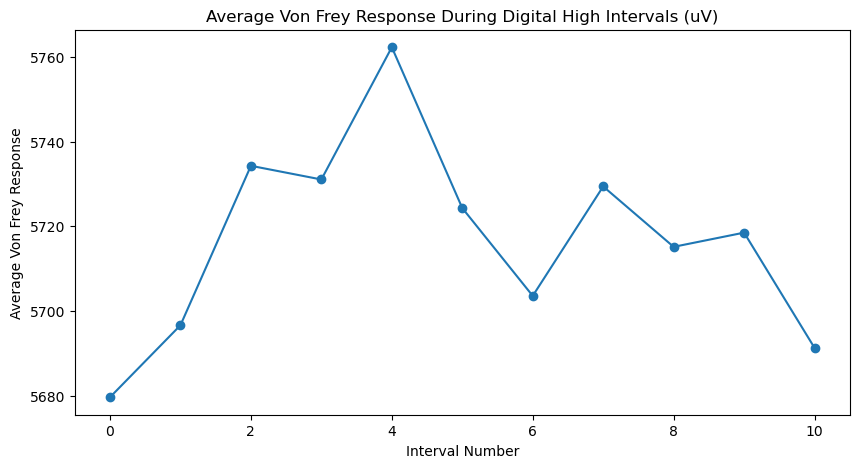

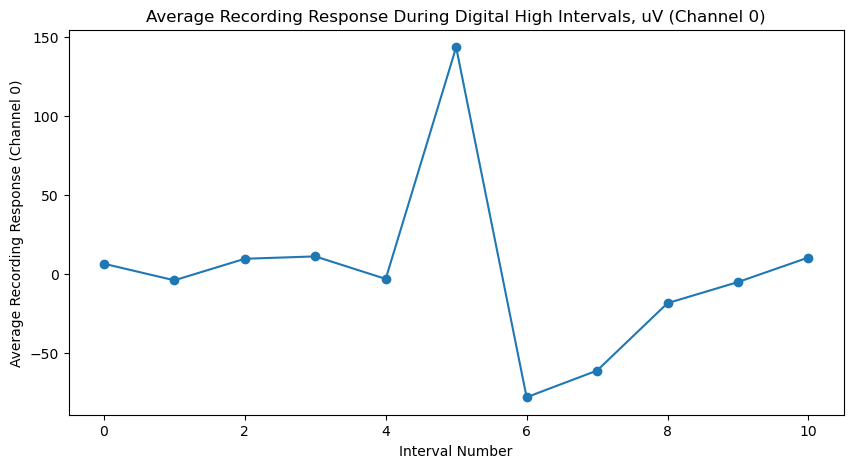

In [19]:
channel_number = 1  # Change to the channel you're interested in

# Plot the average Von Frey response during each interval
plt.figure(figsize=(10, 5))
plt.plot(von_frey_averages, marker='o')
plt.xlabel('Interval Number')
plt.ylabel('Average Von Frey Response')
plt.title('Average Von Frey Response During Digital High Intervals (uV)')
plt.show()

# Plot the average recording response for a specific channel (e.g., channel 0)
channel_number = 0  # Change to the channel you're interested in
plt.figure(figsize=(10, 5))
plt.plot(recording_averages[:, channel_number], marker='o')
plt.xlabel('Interval Number')
plt.ylabel(f'Average Recording Response (Channel {channel_number})')
plt.title(f'Average Recording Response During Digital High Intervals, uV (Channel {channel_number})')
plt.show()


# 🖼 Export Results to binary and run Kilosort trial summary

### run trial review

In [20]:
# signals.save_spinalcord_data_to_binary(TRIAL_NAMES=["VF_8_241125_161626",
# #                                                      ])
# signals.save_spinalcord_data_to_binary()

spikes = Kilosort_wrapper(SAVE_DIRECTORY, PROBE_DIRECTORY)

# NOTE: running the trial summary will take some time. I've commented it out. if you need to generate kilosort outputs, then uncomment
# spikes.run_kilosort_trial_summary()

Preparing Kilosort wrapper...


### import results from kilosort to run further analysis

In [21]:
spikes.extract_kilosort_outputs()

Kilosort directory not found for trial: qsttest_1_241115_150618
Kilosort directory not found for trial: qsttest_1_241115_151239
Kilosort directory not found for trial: qsttest_1_241115_151523
Kilosort directory not found for trial: qst_1_241115_152031
Kilosort directory not found for trial: qst_1_241115_152346
Kilosort directory not found for trial: qst_1_241115_152800
Kilosort directory not found for trial: VF_DRG_1_241115_145120
Kilosort directory not found for trial: VF_DRG_1_241115_145435
Kilosort directory not found for trial: VF_DRG_1_241115_145739
Kilosort directory not found for trial: VF_DRG_4_241115_153512
Kilosort directory not found for trial: VF_DRG_4_241115_170440


- **`ops`**: Loads the Kilosort options dictionary, which includes parameters and processing information.
- **`cluster_amplitudes` & `contamination_percentage`**: Load cluster amplitudes and contamination percentages from TSV files.
- **`channel_mapping`**: Loads the mapping of electrode channels.
- **`templates`**: Loads the spike waveform templates.
- **`chan_best`**: Identifies the best (most representative) channel for each template by finding the channel with the maximum energy (sum of squared amplitudes).
- **`amplitudes`**: Loads the amplitudes of detected spikes.
- **`spike_times`**: Loads spike times, typically in sample indices.
- **`spike_clusters`**: Loads cluster assignments for each spike.
- **`firing_rates`**: Calculates the firing rate for each unit (cluster) by counting the number of spikes and normalizing by the total recording time.
- **`dshift`**: Extracts the drift shift values from the options dictionary, which indicates the movement of the recording probe over time.

In [22]:
spikes.kilosort_results["VF_DRG_1_241115_145739"]["ops"]

KeyError: 'VF_DRG_1_241115_145739'

In [ ]:
from collections import Counter
# Get spike times and clusters from Kilosort results
# Assuming the results are stored in spikes.kilosort_results
# Use the appropriate trial name
trial_name = VF_DRG_pre  # Ensure this matches your actual trial name in kilosort_results
kilosort_output = spikes.kilosort_results[trial_name]

st = kilosort_output['spike_times']  # Spike times in samples
clu = kilosort_output['spike_clusters']  # Cluster assignments
sampling_rate_kilosort = kilosort_output['ops']['fs']  # Sampling rate used in Kilosort (should match)

# Convert spike times to seconds
spike_times_sec = st / sampling_rate_kilosort

# Initialize a list to store firing rates per interval
firing_rates_intervals = []

# Loop over each adjusted time window
for start_time, end_time in zip(adjusted_start_times, adjusted_end_times):
    # Find spikes within the time window
    indices_in_window = np.where((spike_times_sec >= start_time) & (spike_times_sec < end_time))[0]
    spikes_in_window = st[indices_in_window]
    clusters_in_window = clu[indices_in_window]
    
    # Calculate the duration of the interval
    window_duration = end_time - start_time  # In seconds
    
    # Count the number of spikes per cluster within the window
    cluster_spike_counts = Counter(clusters_in_window)
    
    # Get all clusters present in the entire recording
    all_clusters = np.unique(clu)
    
    # Initialize firing rates with zero for all clusters
    firing_rates = {cluster: 0 for cluster in all_clusters}
    
    # Compute firing rates for clusters present in the window
    for cluster in all_clusters:
        count = cluster_spike_counts.get(cluster, 0)
        firing_rates[cluster] = count / window_duration  # Firing rate in Hz
    
    # Append the firing rates dictionary to the list
    firing_rates_intervals.append(firing_rates)

# Convert the list of dictionaries to a DataFrame
# Each row corresponds to an interval, columns are clusters
firing_rates_df = pd.DataFrame(firing_rates_intervals)

# Optionally, fill NaN values with zeros (clusters not firing in an interval)
firing_rates_df = firing_rates_df.fillna(0)

# Display the firing rates DataFrame
print("Firing Rates during Adjusted Intervals (Hz):")
print(firing_rates_df)

# Plotting the firing rates for a specific cluster across intervals
cluster_to_plot = all_clusters[0]  # Replace with the cluster you're interested in
plt.figure(figsize=(10, 5))
plt.plot(firing_rates_df[cluster_to_plot], marker='o')
plt.xlabel('Interval Number')
plt.ylabel('Firing Rate (Hz)')
plt.title(f'Firing Rate of Cluster {cluster_to_plot} Across Intervals')
plt.show()

# Optionally, plot the firing rates of all clusters as a heatmap
plt.figure(figsize=(12, 8))
plt.imshow(firing_rates_df.T, aspect='auto', cmap='hot', interpolation='nearest')
plt.colorbar(label='Firing Rate (Hz)')
plt.xlabel('Interval Number')
plt.ylabel('Cluster')
plt.yticks(ticks=np.arange(len(all_clusters)), labels=all_clusters)
plt.title('Firing Rates of Clusters Across Intervals')
plt.show()

In [ ]:
firing_rates_df

In [ ]:

# Calculate the standard deviation for each cluster across intervals
std_firing_rates = firing_rates_df.std(axis=0)

# Determine a threshold for "significant change" in firing rate
# For example, clusters with a standard deviation greater than the median are highlighted
threshold = std_firing_rates.median()

# Identify units that show significant changes versus stable units
significant_units = std_firing_rates > threshold
stable_units = ~significant_units

# Plotting
plt.figure(figsize=(18, 6))

# Plot the stable units with low opacity and thinner lines
for cluster in firing_rates_df.columns[stable_units]:
    plt.plot(firing_rates_df[cluster], marker='o', linestyle='-', linewidth=1, alpha=0.5, color='gray')

# Plot the significant units with higher opacity and thicker lines
for cluster in firing_rates_df.columns[significant_units]:
    plt.plot(firing_rates_df[cluster], marker='o', linestyle='-', linewidth=2, alpha=0.9, label=f'Cluster {cluster}')

# Highlighting
plt.xlabel('Von Frey Trial', fontsize=14)
plt.ylabel('Firing Rate (Hz)', fontsize=14)
plt.title('Firing Rates of Clusters Across Von Frey Trials', fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Optional: Add a legend for clusters with significant changes outside the plot
plt.legend(title='Cluster ID', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1, fontsize='small', frameon=False)

# Adjust layout to accommodate the legend outside the plot
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust the plot area to make space for the legend
plt.savefig(r'D:\Data\CMU.80 Data\88 Analyzed Data\88.003 Initial Analysis, DW333\figures\firing_rates.png', dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
# Plot the average Von Frey response during each interval
plt.figure(figsize=(10, 5))
plt.plot(von_frey_averages, marker='o')
plt.xlabel('Interval Number')
plt.ylabel('Average Von Frey Response')
plt.title('Average Von Frey Response During Digital High Intervals (uV)')
plt.show()


## extracting spikes in useful range of 2.5Hz to 15Hz

(1) Hao, H.; Ramli, R.; Wang, C.; Liu, C.; Shah, S.; Mullen, P.; Lall, V.; Jones, F.; Shao, J.; Zhang, H.; Jaffe, D. B.; Gamper, N.; Du, X. Dorsal Root Ganglia Control Nociceptive Input to the Central Nervous System. PLoS Biol 2023, 21 (1), e3001958. https://doi.org/10.1371/journal.pbio.3001958.


In [ ]:
from collections import Counter


# Assuming `spikes` is a Kilosort_wrapper instance and `VF_DRG_pre` is the trial name
trial_name = VF_DRG_pre
kilosort_output = spikes.kilosort_results[trial_name]

st = kilosort_output['spike_times']  # Spike times in samples
clu = kilosort_output['spike_clusters']  # Cluster assignments
sampling_rate_kilosort = kilosort_output['ops']['fs']  # Sampling rate used in Kilosort (should match)

# Convert spike times to seconds
spike_times_sec = st / sampling_rate_kilosort

# Initialize a list to store firing rates per interval
firing_rates_intervals = []

# Loop over each adjusted time window
for start_time, end_time in zip(adjusted_start_times, adjusted_end_times):
    # Find spikes within the time window
    indices_in_window = np.where((spike_times_sec >= start_time) & (spike_times_sec < end_time))[0]
    spikes_in_window = st[indices_in_window]
    clusters_in_window = clu[indices_in_window]
    
    # Calculate the duration of the interval
    window_duration = end_time - start_time  # In seconds
    
    # Count the number of spikes per cluster within the window
    cluster_spike_counts = Counter(clusters_in_window)
    
    # Get all clusters present in the entire recording
    all_clusters = np.unique(clu)
    
    # Initialize firing rates with zero for all clusters
    firing_rates = {cluster: 0 for cluster in all_clusters}
    
    # Compute firing rates for clusters present in the window
    for cluster in all_clusters:
        count = cluster_spike_counts.get(cluster, 0)
        firing_rates[cluster] = count / window_duration  # Firing rate in Hz
    
    # Append the firing rates dictionary to the list
    firing_rates_intervals.append(firing_rates)

# Convert the list of dictionaries to a DataFrame
# Each row corresponds to an interval, columns are clusters
firing_rates_df = pd.DataFrame(firing_rates_intervals)

# Optionally, fill NaN values with zeros (clusters not firing in an interval)
firing_rates_df = firing_rates_df.fillna(0)

# Calculate the average firing rate for each cluster across all intervals
average_firing_rates = firing_rates_df.mean()

# Filter clusters with average firing rates between 2.5Hz and 15Hz
filtered_clusters = average_firing_rates[(average_firing_rates >= 2) & (average_firing_rates <= 15)].index

# Filter the firing rates DataFrame to only include the desired clusters
firing_rates_df_filtered = firing_rates_df[filtered_clusters]

# Display the filtered firing rates DataFrame
print("Filtered Firing Rates during Adjusted Intervals (Hz):")
print(firing_rates_df_filtered)

# Plotting the firing rates for a specific filtered cluster across intervals
if not filtered_clusters.empty:
    cluster_to_plot = filtered_clusters[0]  # Replace with the cluster you're interested in
    plt.figure(figsize=(10, 5))
    plt.plot(firing_rates_df_filtered[cluster_to_plot], marker='o')
    plt.xlabel('Interval Number')
    plt.ylabel('Firing Rate (Hz)')
    plt.title(f'Firing Rate of Cluster {cluster_to_plot} Across Intervals')
    plt.show()

# Optionally, plot the firing rates of all filtered clusters as a heatmap
plt.figure(figsize=(12, 8))
plt.imshow(firing_rates_df_filtered.T, aspect='auto', cmap='hot', interpolation='nearest')
plt.colorbar(label='Firing Rate (Hz)')
plt.xlabel('Interval Number')
plt.ylabel('Cluster')
plt.yticks(ticks=np.arange(len(filtered_clusters)), labels=filtered_clusters)
plt.title('Firing Rates of Filtered Clusters Across Intervals')
plt.show()


In [ ]:
# Calculate the standard deviation for each cluster across intervals (only for filtered clusters)
std_firing_rates_filtered = firing_rates_df_filtered.std(axis=0)

# Determine a threshold for "significant change" in firing rate (using median of filtered clusters)
threshold_filtered = std_firing_rates_filtered.median()

# Identify units that show significant changes versus stable units among filtered clusters
significant_units_filtered = std_firing_rates_filtered > threshold_filtered
stable_units_filtered = ~significant_units_filtered

# Plotting only the filtered clusters
plt.figure(figsize=(18, 6))

# Plot the stable units with low opacity and thinner lines (filtered clusters only)
for cluster in firing_rates_df_filtered.columns[stable_units_filtered]:
    plt.plot(firing_rates_df_filtered[cluster], marker='o', linestyle='-', linewidth=1, alpha=0.5, color='gray')

# Plot the significant units with higher opacity and thicker lines (filtered clusters only)
for cluster in firing_rates_df_filtered.columns[significant_units_filtered]:
    plt.plot(firing_rates_df_filtered[cluster], marker='o', linestyle='-', linewidth=2, alpha=0.9, label=f'Cluster {cluster}')

# Highlighting
plt.xlabel('Von Frey Trial', fontsize=14)
plt.ylabel('Firing Rate (Hz)', fontsize=14)
plt.title('Firing Rates of Filtered Clusters Across Von Frey Trials', fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Optional: Add a legend for clusters with significant changes outside the plot
plt.legend(title='Cluster ID', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1, fontsize='small', frameon=False)

# Adjust layout to accommodate the legend outside the plot
plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust the plot area to make space for the legend
plt.savefig(r'D:\Data\CMU.80 Data\88 Analyzed Data\88.003 Initial Analysis, DW333\figures\firing_rates_filtered.png', dpi=300, bbox_inches='tight')
plt.show()


## plot relationship between spiking activity and 

In [ ]:
# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt

# # Assume von_frey_averages and firing_rates_df_filtered have been computed earlier

# # Split data into first 7 and last 7 trials
# first_half_indices = list(range(7))
# second_half_indices = list(range(7, 11))

# # Extract data for the first 7 and last 7 trials
# von_frey_first_half = von_frey_averages[first_half_indices]
# von_frey_second_half = von_frey_averages[second_half_indices]

# firing_rates_first_half = firing_rates_df_filtered.iloc[first_half_indices].mean(axis=1)
# firing_rates_second_half = firing_rates_df_filtered.iloc[second_half_indices].mean(axis=1)

# # Create a pandas DataFrame with the results
# data = {
#     "Trial Set": ["First 7 Trials"] * 7 + ["Last 7 Trials"] * 7,
#     "Von Frey Voltage (uV)": list(von_frey_first_half) + list(von_frey_second_half),
#     "Average Firing Rate (Hz)": list(firing_rates_first_half) + list(firing_rates_second_half)
# }

# df_comparison = pd.DataFrame(data)

# # Display the DataFrame
# print(df_comparison)

# # Plot the relationship between Von Frey voltage and spiking rate for each group
# plt.figure(figsize=(10, 6))

# # First 7 trials
# plt.plot(von_frey_first_half, firing_rates_first_half, marker='o', linestyle='-', linewidth=2, color='blue', label='First 7 Trials')

# # Last 7 trials
# plt.plot(von_frey_second_half, firing_rates_second_half, marker='o', linestyle='-', linewidth=2, color='red', label='Last 7 Trials')

# # Labels and legend
# plt.xlabel('Von Frey Voltage (uV)', fontsize=14)
# plt.ylabel('Average Firing Rate (Hz)', fontsize=14)
# plt.title('Average Firing Rate vs Von Frey Voltage', fontsize=16)
# plt.legend(title='Trial Group', fontsize=12)
# plt.grid(True, linestyle='--', alpha=0.6)
# plt.tight_layout()

# # Save the plot if needed
# plt.savefig(r'D:\Data\CMU.80 Data\88 Analyzed Data\88.003 Initial Analysis, DW333\figures\von_frey_vs_firing_rate_comparison.png', dpi=300, bbox_inches='tight')
# plt.show()


In [ ]:
von_frey_averages

In [ ]:


# Assume von_frey_averages and firing_rates_df_filtered have been computed earlier

# Get the total number of trials available
total_trials = len(von_frey_averages)

# Calculate midpoint to split the trials into two halves
mid_point = total_trials // 2

# Split data into first half and second half of trials
first_half_indices = list(range(mid_point))
second_half_indices = list(range(mid_point, total_trials))

# Extract data for the first and last half of trials
von_frey_first_half = von_frey_averages[first_half_indices]
von_frey_second_half = von_frey_averages[second_half_indices]

firing_rates_first_half = firing_rates_df_filtered.iloc[first_half_indices].mean(axis=1)
firing_rates_second_half = firing_rates_df_filtered.iloc[second_half_indices].mean(axis=1)

# Create a pandas DataFrame with the results
data = {
    "Trial Set": ["First Half Trials"] * len(first_half_indices) + ["Second Half Trials"] * len(second_half_indices),
    "Von Frey Voltage (uV)": list(von_frey_first_half) + list(von_frey_second_half),
    "Average Firing Rate (Hz)": list(firing_rates_first_half) + list(firing_rates_second_half)
}

df_comparison = pd.DataFrame(data)

# Display the DataFrame
print(df_comparison)

# Plot the relationship between Von Frey voltage and spiking rate for each group
plt.figure(figsize=(10, 6))

# First half trials
plt.plot(von_frey_first_half, firing_rates_first_half, marker='o', linestyle='-', linewidth=2, color='blue', label='First Half Trials')

# Second half trials
plt.plot(von_frey_second_half, firing_rates_second_half, marker='o', linestyle='-', linewidth=2, color='red', label='Second Half Trials')

# Labels and legend
plt.xlabel('Von Frey Voltage (uV)', fontsize=14)
plt.ylabel('Average Firing Rate (Hz)', fontsize=14)
plt.title('Average Firing Rate vs Von Frey Voltage', fontsize=16)
plt.legend(title='Trial Group', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()

# Save the plot if needed
plt.savefig(r'D:\Data\CMU.80 Data\88 Analyzed Data\88.003 Initial Analysis, DW333\figures\von_frey_vs_firing_rate_comparison.png', dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress

# Assume von_frey_averages and firing_rates_df_filtered have been computed earlier

# Get the total number of trials available
total_trials = len(von_frey_averages)

# Calculate midpoint to split the trials into two halves
mid_point = total_trials // 2

# Split data into first half and second half of trials
first_half_indices = list(range(mid_point))
second_half_indices = list(range(mid_point, total_trials))

# Extract data for the first and last half of trials
von_frey_first_half = von_frey_averages[first_half_indices]
von_frey_second_half = von_frey_averages[second_half_indices]

firing_rates_first_half = firing_rates_df_filtered.iloc[first_half_indices].mean(axis=1)
firing_rates_second_half = firing_rates_df_filtered.iloc[second_half_indices].mean(axis=1)

# Create a pandas DataFrame with the results
data = {
    "Trial Set": ["First Half Trials"] * len(first_half_indices) + ["Second Half Trials"] * len(second_half_indices),
    "Von Frey Voltage (uV)": list(von_frey_first_half) + list(von_frey_second_half),
    "Average Firing Rate (Hz)": list(firing_rates_first_half) + list(firing_rates_second_half)
}

df_comparison = pd.DataFrame(data)

# Display the DataFrame
print(df_comparison)

# Scatter plot the relationship between Von Frey voltage and spiking rate for each group
plt.figure(figsize=(10, 6))

# Scatter plot for the first half trials
plt.scatter(von_frey_first_half, firing_rates_first_half, color='blue', alpha=0.7, label='First Half Trials')

# Scatter plot for the second half trials
plt.scatter(von_frey_second_half, firing_rates_second_half, color='red', alpha=0.7, label='Second Half Trials')

# Calculate and plot trend lines
# First half trend line
slope, intercept, r_value, p_value, std_err = linregress(von_frey_first_half, firing_rates_first_half)
trendline_first_half = intercept + slope * np.array(von_frey_first_half)
plt.plot(von_frey_first_half, trendline_first_half, color='blue', linestyle='--', linewidth=2)

# Second half trend line
slope, intercept, r_value, p_value, std_err = linregress(von_frey_second_half, firing_rates_second_half)
trendline_second_half = intercept + slope * np.array(von_frey_second_half)
plt.plot(von_frey_second_half, trendline_second_half, color='red', linestyle='--', linewidth=2)

# Labels and legend
plt.xlabel('Von Frey Voltage (uV)', fontsize=14)
plt.ylabel('Average Firing Rate (Hz)', fontsize=14)
plt.title('Average Firing Rate vs Von Frey Voltage', fontsize=16)
plt.legend(title='Trial Group', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()

# Save the plot if needed
plt.savefig(r'D:\Data\CMU.80 Data\88 Analyzed Data\88.003 Initial Analysis, DW333\figures\von_frey_vs_firing_rate_trendline.png', dpi=300, bbox_inches='tight')
plt.show()


# raster plots

filter good unit

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have kilosort results loaded into 'kilosort_output'

# Extract cluster amplitudes, contamination levels, and firing rates
cluster_amplitudes = kilosort_output.get('cluster_amplitudes', None)
contamination_percentages = kilosort_output.get('contamination_percentage', None)
average_firing_rates = firing_rates_df.mean(axis=0)

# Set thresholds for filtering
amplitude_threshold = 50  # uV, adjust as per your requirement
contamination_threshold = 10  # %, adjust as needed
firing_rate_threshold = 0.5  # Hz, filter units with firing rates below 0.5 Hz

# Apply filtering based on available quality metrics
good_units_mask = np.ones(len(average_firing_rates), dtype=bool)

# Filter based on amplitudes
if cluster_amplitudes is not None:
    good_units_mask &= cluster_amplitudes > amplitude_threshold

# Filter based on contamination percentage
if contamination_percentages is not None:
    good_units_mask &= contamination_percentages < contamination_threshold

# Filter based on average firing rate
good_units_mask &= average_firing_rates > firing_rate_threshold

# Apply mask to filter out bad units
good_units = average_firing_rates.index[good_units_mask]

# Update the firing_rates_df to only include good units
firing_rates_df_filtered = firing_rates_df[good_units]

# Now 'firing_rates_df_filtered' only contains data from units that passed the filtering criteria
print(f"Number of good units: {len(good_units)}")
print("Filtered Firing Rates DataFrame:")
print(firing_rates_df_filtered)

# Optionally, re-run any further analyses using this filtered set of units


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assume `spike_times_sec` contains all spike times in seconds
# `clu` contains corresponding cluster assignments for each spike time
# `good_units` contains the indices of the units that passed the filtering

# Filtering spike times for good units
good_spike_indices = np.isin(clu, good_units)
good_spike_times = spike_times_sec[good_spike_indices]
good_clusters = clu[good_spike_indices]

# Sort the good units to make plotting easier
sorted_good_units = sorted(good_units)

# Create a figure for the raster plot
plt.figure(figsize=(15, 6))

# Loop through each unit and plot its spikes
for unit_idx, unit in enumerate(sorted_good_units):
    unit_spike_times = good_spike_times[good_clusters == unit]
    
    # Plot each spike as a vertical line at the appropriate time
    plt.vlines(unit_spike_times, unit_idx + 0.5, unit_idx + 1.5, color=f'C{unit_idx % 10}', alpha=0.8, linewidth=1)

# Label the axes and add titles similar to the figure
plt.xlabel('Time (s)', fontsize=14)
plt.ylabel('Unit', fontsize=14)
plt.yticks(np.arange(1, len(sorted_good_units) + 1), labels=[str(unit) for unit in sorted_good_units])
plt.title('Raster Plot of Good Units with Von Frey Stimulus Windows', fontsize=16)
plt.grid(axis='x', linestyle='--', alpha=0.5)

# Add sections to show Von Frey stimulus windows
for start, end in zip(adjusted_start_times, adjusted_end_times):
    plt.axvspan(start, end, color='orange', alpha=0.3, label='Von Frey Stimulus')

# Avoid duplicate labels in the legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc='upper right')

plt.tight_layout()
plt.show()
